<a href="https://colab.research.google.com/github/gerardfp/analisi_enquesta/blob/main/multiindex_analisis_enquesta.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import matplotlib
import matplotlib.pylab as plt
import seaborn as sns
import numpy as np
from google.colab import auth
from collections import Counter
import gspread
from gspread_dataframe import set_with_dataframe
from oauth2client.client import GoogleCredentials
from google.colab import drive

%config InlineBackend.figure_format = 'retina'

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

auth.authenticate_user()
drive.mount('drive')

gc = gspread.authorize(GoogleCredentials.get_application_default())
worksheet = gc.open('Formulari_05_06_21 (respuestas)').sheet1
rows = worksheet.get_all_values()
df = pd.DataFrame.from_records(rows)
df.columns = df.iloc[0]
df = df.iloc[1:]

df.rename(columns={'Gènere:': "Gènere", 
                   'Categoria laboral:': "Categoria", 
                   'Contracte de treball': "Contracte", 
                   'Centre de treball:': "Centre"}, inplace=True)
df.drop(['Marca temporal','Edat:','Antiguitat en l\'entitat (anys):'], axis=1, errors='ignore', inplace=True)

df['Edat'] = df['Edat'].astype('int')
df['Antiguitat'] = df['Antiguitat'].replace(',', '.',regex=True).astype('float')

catOrder = ['Directiu/va','Comandament intermedi','Tècnic/a','Treballador/a qualificat/da','Treballador/a de baixa qualificació']

df['Categoria'] = df['Categoria'].astype(pd.api.types.CategoricalDtype(categories=catOrder, ordered=True))

AgeClass = ['20-29','30-39','40-49','50-59','60-69']
df['GrupEdat'] = pd.cut(df['Edat'], bins=[20,30,40,50,60,70], labels=AgeClass, right=False)

AntiguitatClass = ['0-4','5-9','10-14','15-19','20-24','25-29']
df['GrupAntiguitat'] = pd.cut(df['Antiguitat'], bins=[0,5,10,15,20,25,30], labels=AntiguitatClass, right=False)

start = 6
nEN = 17
nPOP = 9
nCO = 8
nAC = 25
nLT = 36
df.rename(columns={df.columns[i]: "EN_"+str(i+1-start) for i in range(start,start+nEN)}, inplace=True)  #17
df.rename(columns={df.columns[i]: "POP_"+str(i+1-start-nEN) for i in range(start+nEN,start+nEN+nPOP)}, inplace=True)  #9
df.rename(columns={df.columns[i]: "CO_"+str(i+1-start-nEN-nPOP) for i in range(start+nEN+nPOP,start+nEN+nPOP+nCO)}, inplace=True)  #8
df.rename(columns={df.columns[i]: "AC_"+str(i+1-start-nEN-nPOP-nCO) for i in range(start+nEN+nPOP+nCO,start+nEN+nPOP+nCO+nAC)}, inplace=True)   #25
df.rename(columns={df.columns[i]: "LT_"+str(i+1-start-nEN-nPOP-nCO-nAC) for i in range(start+nEN+nPOP+nCO+nAC,start+nEN+nPOP+nCO+nAC+nLT)}, inplace=True)  #36

likert1 = {'Mai': 1, 'Gairebé mai': 2, 'Algunes vegades': 3, 'Regularment': 4, 'Bastantes vegades': 5, 'Gairebé sempre': 6, 'Sempre': 7}
#likert1 = {'Mai': 0, 'Gairebé mai': 1, 'Algunes vegades': 2, 'Regularment': 3, 'Bastantes vegades': 4, 'Gairebé sempre': 5, 'Sempre': 6}
likert2 = {'Molt en desacord': 1, 'En desacord': 2, 'En acord': 3, 'Molt d\'acord': 4}
likert3 = {'Mai': 1, 'Gairebé mai': 2, 'A vegades': 3, 'Sovint': 4, 'Fregüentment o gairebé sempre': 5}

qSOCIO = ['Gènere', 'Categoria', 'Contracte', 'Centre']
qLT = ['LT_'+str(i) for i in range(1, nLT+1)]
qEN = ['EN_'+str(i) for i in range(1, nEN+1)]
qPOP = ['POP_'+str(i) for i in range(1, nPOP+1)]
qCO = ['CO_'+str(i) for i in range(1, nCO+1)]
qAC = ['AC_'+str(i) for i in range(1, nAC+1)]

qALL = qLT + qEN + qPOP + qCO + qAC

factors = {
    "LT": ['LT_IIA','LT_IIC','LT_MI','LT_EI','LT_CI','LT_RC','LT_LF','LT_DPE_A','LT_DPE_P'],
    "EN": ['EN_VI','EN_DE','EN_AB'],
    "POP": ['POP_'+str(i) for i in range(1, nPOP+1)],
    "CO": ['CO_H', 'CO_V'],
    "AC": ['AC_A','AC_C','AC_TP']
}

iLT_IIA = ['LT_10', 'LT_18','LT_21','LT_25']
iLT_IIC = ['LT_6', 'LT_14','LT_23','LT_34']
iLT_MI = ['LT_9', 'LT_13','LT_26','LT_36']
iLT_EI = ['LT_2', 'LT_8','LT_30','LT_32']
iLT_CI = ['LT_15', 'LT_19','LT_29','LT_31']
iLT_RC = ['LT_1', 'LT_11','LT_16','LT_26','LT_36']
iLT_LF = ['LT_5', 'LT_7','LT_28','LT_33']
iLT_DPE_A = ['LT_4', 'LT_22','LT_24','LT_27']
iLT_DPE_P = ['LT_3', 'LT_12','LT_17','LT_19']
iEN_VI = ['EN_1', 'EN_4','EN_8','EN_12','EN_15','EN_16']
iEN_DE = ['EN_2', 'EN_5','EN_7','EN_10','EN_13']
iEN_AB = ['EN_3', 'EN_6','EN_9','EN_11','EN_14','EN_16']
iAC_A = ['AC_1', 'AC_3','AC_5','AC_7','AC_12','AC_13','AC_15']
iAC_C = ['AC_2', 'AC_4','AC_6','AC_8','AC_9','AC_10','AC_11','AC_14','AC_16']
iAC_TP = ['AC_17', 'AC_18','AC_19','AC_20','AC_21','AC_22','AC_23','AC_24','AC_25']
iCO_H = ['CO_1', 'CO_2','CO_3','CO_4']
iCO_V = ['CO_5', 'CO_6','CO_7','CO_8']

# iALL = iLT + iEN + iPOP + iCO + iAC
# totals = ['LT_TOTAL','EN_TOTAL','POP_TOTAL','CO_TOTAL','AC_TOTAL']

# iqALL = qLT + iLT + ['LT_TOTAL'] +qEN + iEN + ['EN_TOTAL'] +qPOP + iPOP + ['POP_TOTAL'] +qCO + iCO + ['CO_TOTAL'] +qAC + iAC + ['AC_TOTAL']

for i in range(1, nEN+1):
  df['EN_'+str(i)] = df['EN_'+str(i)].map(likert1)

for i in range(1, nPOP+1):
  df['POP_'+str(i)] = df['POP_'+str(i)].map(likert1)

for i in range(1, nCO+1):
  df['CO_'+str(i)] = df['CO_'+str(i)].map(likert1)

for i in range(1, nAC+1):
  df['AC_'+str(i)] = df['AC_'+str(i)].map(likert2)

for i in range(1, nLT+1):
  df['LT_'+str(i)] = df['LT_'+str(i)].map(likert3)

df["S"] = df.index
#display(df[qCO])

#Gènere	Edat	Antiguitat	Categoria	Contracte	Centre	EN_1	EN_2	EN_3	EN_4	EN_5	EN_6	EN_7	EN_8	EN_9	EN_10	EN_11	EN_12	EN_13	EN_14	EN_15	EN_16	EN_17	POP_1	POP_2	POP_3	POP_4	POP_5	POP_6	POP_7	POP_8	POP_9	CO_1	CO_2	CO_3	CO_4	CO_5	CO_6	CO_7	CO_8	AC_1	AC_2	AC_3	AC_4	AC_5	AC_6	AC_7	AC_8	AC_9	AC_10	AC_11	AC_12	AC_13	AC_14	AC_15	AC_16	AC_17	AC_18	AC_19	AC_20	AC_21	AC_22	AC_23	AC_24	AC_25	LT_1	LT_2	LT_3	LT_4	LT_5	LT_6	LT_7	LT_8	LT_9	LT_10	LT_11	LT_12	LT_13	LT_14	LT_15	LT_16	LT_17	LT_18	LT_19	LT_20	LT_21	LT_22	LT_23	LT_24	LT_25	LT_26	LT_27	LT_28	LT_29	LT_30	LT_31	LT_32	LT_33	LT_34	LT_35	LT_36	GrupEdat


tuples = [          
('SOCIO','SOCIO','SOCIO','Gènere'),
('SOCIO','SOCIO','SOCIO','Edat'), 
('SOCIO','SOCIO','SOCIO','Antiguitat'), 
('SOCIO','SOCIO','SOCIO','Categoria'), 
('SOCIO','SOCIO','SOCIO','Contracte'), 
('SOCIO','SOCIO','SOCIO','Centre'),

('QS','EN','EN_VI','EN_1'),
('QS','EN','EN_DE','EN_2'),
('QS','EN','EN_AB','EN_3'),
('QS','EN','EN_VI','EN_4'),
('QS','EN','EN_DE','EN_5'),
('QS','EN','EN_AB','EN_6'),
('QS','EN','EN_DE','EN_7'),
('QS','EN','EN_VI','EN_8'),
('QS','EN','EN_AB','EN_9'),
('QS','EN','EN_DE','EN_10'),
('QS','EN','EN_AB','EN_11'),
('QS','EN','EN_VI','EN_12'),
('QS','EN','EN_DE','EN_13'),
('QS','EN','EN_AB','EN_14'),
('QS','EN','EN_VI','EN_15'),
('QS','EN','EN_AB','EN_16'),
('QS','EN','EN_VI','EN_17'),

('QS','POP','POP_1','POP_1'),
('QS','POP','POP_2','POP_2'),
('QS','POP','POP_3','POP_3'),
('QS','POP','POP_4','POP_4'),
('QS','POP','POP_5','POP_5'),
('QS','POP','POP_6','POP_6'),
('QS','POP','POP_7','POP_7'),
('QS','POP','POP_8','POP_8'),
('QS','POP','POP_9','POP_9'),

('QS','CO','CO_H','CO_1'), 
('QS','CO','CO_H','CO_2'), 
('QS','CO','CO_H','CO_3'), 
('QS','CO','CO_H','CO_4'), 
('QS','CO','CO_V','CO_5'), 
('QS','CO','CO_V','CO_6'), 
('QS','CO','CO_V','CO_7'), 
('QS','CO','CO_V','CO_8'),

('QS','AC','AC_A','AC_1'),
('QS','AC','AC_C','AC_2'),
('QS','AC','AC_A','AC_3'),
('QS','AC','AC_C','AC_4'),
('QS','AC','AC_A','AC_5'),
('QS','AC','AC_C','AC_6'),
('QS','AC','AC_A','AC_7'),
('QS','AC','AC_C','AC_8'),
('QS','AC','AC_C','AC_9'),
('QS','AC','AC_C','AC_10'),
('QS','AC','AC_C','AC_11'),
('QS','AC','AC_A','AC_12'),
('QS','AC','AC_A','AC_13'),
('QS','AC','AC_C','AC_14'),
('QS','AC','AC_A','AC_15'),
('QS','AC','AC_C','AC_16'),
('QS','AC','AC_TP','AC_17'),
('QS','AC','AC_TP','AC_18'),
('QS','AC','AC_TP','AC_19'),
('QS','AC','AC_TP','AC_20'),
('QS','AC','AC_TP','AC_21'),
('QS','AC','AC_TP','AC_22'),
('QS','AC','AC_TP','AC_23'),
('QS','AC','AC_TP','AC_24'),
('QS','AC','AC_TP','AC_25'),

# ('QS','LT','LT_LTA','LT_1'),
# ('QS','LT','LT_LTF','LT_2'),
# ('QS','LT','LT_LTA','LT_3'),
# ('QS','LT','LT_LTA','LT_4'),
# ('QS','LT','LT_LTLF','LT_5'),
# ('QS','LT','LT_LTF','LT_6'),
# ('QS','LT','LT_LTLF','LT_7'),
# ('QS','LT','LT_LTF','LT_8'),
# ('QS','LT','LT_LTF','LT_9'),
# ('QS','LT','LT_LTF','LT_10'),
# ('QS','LT','LT_LTA','LT_11'),
# ('QS','LT','LT_LTA','LT_12'),
# ('QS','LT','LT_LTF','LT_13'),
# ('QS','LT','LT_LTF','LT_14'),
# ('QS','LT','LT_LTF','LT_15'),
# ('QS','LT','LT_LTA','LT_16'),
# ('QS','LT','LT_LTA','LT_17'),
# ('QS','LT','LT_LTF','LT_18'),
# ('QS','LT','LT_LTF','LT_19'),
# ('QS','LT','LT_LTA','LT_20'),
# ('QS','LT','LT_LTF','LT_21'),
# ('QS','LT','LT_LTA','LT_22'),
# ('QS','LT','LT_LTF','LT_23'),
# ('QS','LT','LT_LTA','LT_24'),
# ('QS','LT','LT_LTF','LT_25'),
# ('QS','LT','LT_LTF','LT_26'),
# ('QS','LT','LT_LTA','LT_27'),
# ('QS','LT','LT_LTLF','LT_28'),
# ('QS','LT','LT_LTF','LT_29'),
# ('QS','LT','LT_LTF','LT_30'),
# ('QS','LT','LT_LTF','LT_31'),
# ('QS','LT','LT_LTF','LT_32'),
# ('QS','LT','LT_LTLF','LT_33'),
# ('QS','LT','LT_LTF','LT_34'),
# ('QS','LT','LT_LTA','LT_35'),
# ('QS','LT','LT_LTF','LT_36'),

('QS','LT','LT_RC','LT_1'),
('QS','LT','LT_EI','LT_2'),
('QS','LT','LT_DPE_P','LT_3'),
('QS','LT','LT_DPE_A','LT_4'),
('QS','LT','LT_LF','LT_5'),
('QS','LT','LT_IIC','LT_6'),
('QS','LT','LT_LF','LT_7'),
('QS','LT','LT_EI','LT_8'),
('QS','LT','LT_MI','LT_9'),
('QS','LT','LT_IIA','LT_10'),
('QS','LT','LT_RC','LT_11'),
('QS','LT','LT_DPE_P','LT_12'),
('QS','LT','LT_MI','LT_13'),
('QS','LT','LT_IIC','LT_14'),
('QS','LT','LT_CI','LT_15'),
('QS','LT','LT_RC','LT_16'),
('QS','LT','LT_DPE_P','LT_17'),
('QS','LT','LT_IIA','LT_18'),
('QS','LT','LT_CI','LT_19'),
('QS','LT','LT_DPE_P','LT_20'),
('QS','LT','LT_IIA','LT_21'),
('QS','LT','LT_DPE_A','LT_22'),
('QS','LT','LT_IIC','LT_23'),
('QS','LT','LT_DPE_A','LT_24'),
('QS','LT','LT_IIA','LT_25'),
('QS','LT','LT_MI','LT_26'),
('QS','LT','LT_DPE_A','LT_27'),
('QS','LT','LT_LF','LT_28'),
('QS','LT','LT_CI','LT_29'),
('QS','LT','LT_EI','LT_30'),
('QS','LT','LT_CI','LT_31'),
('QS','LT','LT_EI','LT_32'),
('QS','LT','LT_LF','LT_33'),
('QS','LT','LT_IIC','LT_34'),
('QS','LT','LT_RC','LT_35'),
('QS','LT','LT_MI','LT_36'),

('SOCIO','SOCIO','SOCIO','GrupEdat'),
('SOCIO','SOCIO','SOCIO','GrupAntiguitat'),
('SOCIO','SOCIO','SOCIO','S'),
]

qorder = ['SOCIO','QS']
qsorder = ['SOCIO','LT','EN','POP','CO','AC']
factorder = ['SOCIO','LT_IIA','LT_IIC','LT_MI','LT_EI','LT_CI','LT_RC','LT_DPE_A','LT_DPE_P','LT_LF','EN_VI','EN_AB','EN_DE','POP_1','POP_2','POP_3','POP_4','POP_5','POP_6','POP_7','POP_8','POP_9','CO_H','CO_V','AC_A','AC_C','AC_TP']

mi = pd.MultiIndex.from_tuples(tuples)

#mi = mi.sortlevel(2, ascending=False)
# mi.set_levels(qorder, level=0, inplace=True)
# mi.set_levels(qsorder, level=1, inplace=True)
# mi.set_levels(factorder, level=2, inplace=True)

df.columns = mi

#display(df.columns)

# cati = pd.CategoricalIndex(
#   df.columns.levels[2],
#   categories=factorder,
#   ordered=True
# )
# df.columns.set_levels(
#   cati, level=2, inplace=True  
# )

# df.sort_index(1, level=2, inplace=True)

dfm = df.melt(id_vars=[('SOCIO','SOCIO','SOCIO','Gènere'),('SOCIO','SOCIO','SOCIO','Edat'),('SOCIO','SOCIO','SOCIO','Antiguitat'),('SOCIO','SOCIO','SOCIO','Contracte'),('SOCIO','SOCIO','SOCIO','Centre'),('SOCIO','SOCIO','SOCIO','Categoria'),('SOCIO','SOCIO','SOCIO','GrupEdat'),('SOCIO','SOCIO','SOCIO','S')])
dfm = dfm.rename(columns={('SOCIO','SOCIO','SOCIO','Gènere'): "Gènere", ('SOCIO','SOCIO','SOCIO','Edat'): "Edat", ('SOCIO','SOCIO','SOCIO','Antiguitat'): "Antiguitat",('SOCIO','SOCIO','SOCIO','Contracte'): "Contracte",('SOCIO','SOCIO','SOCIO','Centre'): "Centre", ('SOCIO','SOCIO','SOCIO','Categoria'): "Categoria", ('SOCIO','SOCIO','SOCIO','GrupEdat'): "GrupEdat",('SOCIO','SOCIO','SOCIO','S'): "S","variable_0":"QSS","variable_1":"QS","variable_2":"Factor","variable_3":"Q"})

idx = pd.IndexSlice

colors = ['#1f77b4', '#d62728','#2ca02c','#ff7f0e','#9467bd','#8c564b','#e377c2','#7f7f7f','#bcbd22','#17becf']

def save_to_sheet(data, title):
  myss = gc.open("AnalisiResultats")
  
  try:
    myws = myss.add_worksheet(title=title, rows=0, cols=0)
  except:
    myws = myss.worksheet(title)

  set_with_dataframe(myws, data)

#save_to_sheet(df,"MULTII")


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.


Drive already mounted at drive; to attempt to forcibly remount, call drive.mount("drive", force_remount=True).


In [ ]:
pd.options.display.float_format = "{:,.2f}".format
# pd.concat([
# df['SOCIO']['SOCIO']['SOCIO'][["Edat","Gènere"]].groupby("Gènere").describe(),
# df['SOCIO']['SOCIO']['SOCIO'][["Edat","GrupAntiguitat"]].groupby("GrupAntiguitat").describe(),
# df['SOCIO']['SOCIO']['SOCIO'][["Edat","Categoria"]].groupby("Categoria").describe(),
# df['SOCIO']['SOCIO']['SOCIO'][["Edat","Contracte"]].groupby("Contracte").describe(),
# df['SOCIO']['SOCIO']['SOCIO'][["Edat","Centre"]].groupby("Centre").describe() 
# ])

# pd.concat([
# df['SOCIO']['SOCIO']['SOCIO'][["Antiguitat","Gènere"]].groupby("Gènere").describe(),
# df['SOCIO']['SOCIO']['SOCIO'][["Antiguitat","GrupEdat"]].groupby("GrupEdat").describe(),
# df['SOCIO']['SOCIO']['SOCIO'][["Antiguitat","Categoria"]].groupby("Categoria").describe(),
# df['SOCIO']['SOCIO']['SOCIO'][["Antiguitat","Contracte"]].groupby("Contracte").describe(),
# df['SOCIO']['SOCIO']['SOCIO'][["Antiguitat","Centre"]].groupby("Centre").describe() 
# ])

tal = df['SOCIO']['SOCIO']['SOCIO'][["Categoria","Gènere"]].groupby(["Categoria","Gènere"]).agg({'Gènere':'count'})
tal['percent'] = tal['Gènere']*100 / tal['Gènere'].agg('sum')

tal
# pd.concat([
# df['SOCIO']['SOCIO']['SOCIO'][["Categoria","Gènere"]].groupby("Categoria").agg({'Gènere':'count'}) #.value_counts(),
# # df['SOCIO']['SOCIO']['SOCIO'][["Categoria","GrupEdat"]].groupby("GrupEdat").describe(),
# # df['SOCIO']['SOCIO']['SOCIO'][["Categoria","GrupAntiguitat"]].groupby("GrupAntiguitat").describe(),
# # df['SOCIO']['SOCIO']['SOCIO'][["Categoria","Contracte"]].groupby("Contracte").describe(),
# # df['SOCIO']['SOCIO']['SOCIO'][["Categoria","Centre"]].groupby("Centre").describe() 
# ])


Gènere  percent
Categoria                           Gènere                 
Directiu/va                         Dona    3      5.26    
                                    Home    1      1.75    
Comandament intermedi               Dona    2      3.51    
                                    Home    2      3.51    
Tècnic/a                            Dona    10     17.54   
                                    Home    6      10.53   
Treballador/a qualificat/da         Dona    15     26.32   
                                    Home    13     22.81   
Treballador/a de baixa qualificació Dona    3      5.26    
                                    Home    2      3.51

In [ ]:
def make_count(data, column, h, a):
  sns.set_theme(style="whitegrid")
  sns.set_context("notebook")
  sns.set_palette(sns.color_palette(colors))
  count_plot = sns.catplot(y=column, data=data, kind="count", height=h, aspect=a)
  count_plot.fig.set_dpi(200)
  count_plot.ax.set_xlabel(count_plot.ax.get_xlabel(), fontsize=7)
  count_plot.tight_layout()

make_count(df['SOCIO']['SOCIO']['SOCIO'], "Gènere", 2, 2.2)
make_count(df['SOCIO']['SOCIO']['SOCIO'], "Categoria", 2, 3.2)
make_count(df['SOCIO']['SOCIO']['SOCIO'], "Contracte", 2, 2.2)
make_count(df['SOCIO']['SOCIO']['SOCIO'], "Centre", 2, 3)

In [ ]:
def make_pyramid(data, y):
  sns.set_theme(style="whitegrid")
  sns.set_context("notebook")
  sns.set_palette(sns.color_palette(colors))
  fig, ax = plt.subplots()
  fig.set_dpi(200)
  fig.set_size_inches(5,2.5)
  plt.xlim(-15,15)
  bar_plot2 = sns.histplot(data[data['Gènere'] == 'Dona'], y=y, weights=[-1 for i in range(33)], color=colors[0], kde=True, fill=True, binwidth=10, binrange=(20,65), ax=ax)
  bar_plot = sns.histplot(data[data['Gènere'] == 'Home'], y=y,  color=colors[1], kde=True, fill=True, binwidth=10, binrange=(20,65), ax=ax)
  bar_plot.set_xticklabels([15, 10, 5, 0, 5, 10, 15])
  bar_plot.set(xlabel="count", ylabel=y)
  bar_plot.set_xlabel(bar_plot.get_xlabel(), fontsize=7)
      
  line3 = matplotlib.lines.Line2D(range(1), range(1), color="white", linestyle='none', marker='s',markersize=10, markerfacecolor=colors[1])
  line4 = matplotlib.lines.Line2D(range(1), range(1), color="white", linestyle='none', marker='s',markersize=10,markerfacecolor=colors[0])

  legend = ax.legend([line4, line3], ["Dones", "Homes"], loc="center left", bbox_to_anchor=(1.1,0.5))
  frame = legend.get_frame()
  frame.set_facecolor("w")
  frame.set_edgecolor("w")

make_pyramid(df['SOCIO']['SOCIO']['SOCIO'], 'Edat')

def make_pyramid2(data):
  sns.set_theme(style="whitegrid")
  sns.set_palette(sns.color_palette(colors))
  fig, ax = plt.subplots()
  fig.set_dpi(80)
  plt.xlim(-15,15)
  bar_plot = sns.histplot(data[data['Gènere'] == 'Home'], y='Antiguitat', weights=[-1 for i in range(24)], color=colors[1], kde=True, fill=True, binwidth=5, binrange=(00,30), ax=ax)
  bar_plot2 = sns.histplot(data[data['Gènere'] == 'Dona'], y='Antiguitat', color=colors[0], kde=True, fill=True, binwidth=5, binrange=(00,30), ax=ax)
  bar_plot.set_xticklabels([15, 10, 5, 0, 5, 10, 15])
  bar_plot.set(xlabel="count", ylabel="Antiguitat")
      
  line3 = matplotlib.lines.Line2D(range(1), range(1), color="white", linestyle='none', marker='s',markersize=15, markerfacecolor=colors[1])
  line4 = matplotlib.lines.Line2D(range(1), range(1), color="white", linestyle='none', marker='s',markersize=15,markerfacecolor=colors[0])

  legend = ax.legend([line4, line3], ["Dones", "Homes"], loc="center left", bbox_to_anchor=(1.1,0.5))
  frame = legend.get_frame()
  frame.set_facecolor("w")
  frame.set_edgecolor("w")

make_pyramid2(df['SOCIO']['SOCIO']['SOCIO'])

In [ ]:
def make_histo2(data ,y, binwidth, binrange, height, aspect):
  sns.set_theme(style="whitegrid")
  sns.set_context("notebook")
  sns.set_palette(sns.color_palette(colors))
  dis_plot = sns.displot(data, y=y, kde=True, fill=True, binwidth=binwidth, binrange=binrange, height=height, aspect=aspect)
  dis_plot.set(xlabel="count")
  dis_plot.ax.set_xlabel(dis_plot.ax.get_xlabel(), fontsize=7)
  dis_plot.ax.spines['top'].set_visible(True)
  dis_plot.ax.spines['right'].set_visible(True)
  dis_plot.ax.spines['bottom'].set_visible(True)
  dis_plot.ax.spines['left'].set_visible(True)
  dis_plot.fig.set_dpi(200)

#make_histo2(df['SOCIO']['SOCIO']['SOCIO'], 'Edat', binwidth=10, binrange=(20,65), height=2.8, aspect=1.5)
#make_histo2(df['SOCIO']['SOCIO']['SOCIO'], 'Antiguitat', binwidth=5, binrange=(00,30), height=3.05, aspect=1.5)

In [ ]:
def make_cat(data,x,y):
  sns.set_theme(style="whitegrid")
  sns.set_context("notebook")
  sns.set_palette(sns.color_palette(colors))
  cat_plot = sns.catplot(x=x, y=y, hue=x, kind="swarm", data=data, height=2.5, aspect=1.5)
  cat_plot.fig.set_dpi(200)
  cat_plot.ax.set_xticklabels([])
  cat_plot.add_legend(loc="center right", bbox_to_anchor=(1.1, 0.5))
  cat_plot.ax.set_xlabel("")

make_cat(df['SOCIO']['SOCIO']['SOCIO'], "Gènere","Antiguitat")

def make_cat2(data,x,y):
  sns.set_theme(style="whitegrid")
  sns.set_context("notebook")
  sns.set_palette(sns.color_palette(colors))
  cat_plot = sns.catplot(x=x, y=y, hue=x, kind="strip", data=data, height=2.5, aspect=1.25)
  cat_plot.fig.set_dpi(200)
  cat_plot.ax.set_xticklabels([])
  cat_plot.add_legend()
  cat_plot.ax.set_xlabel("")

make_cat2(df['SOCIO']['SOCIO']['SOCIO'], "Categoria","Antiguitat")
make_cat2(df['SOCIO']['SOCIO']['SOCIO'], "Centre","Antiguitat")

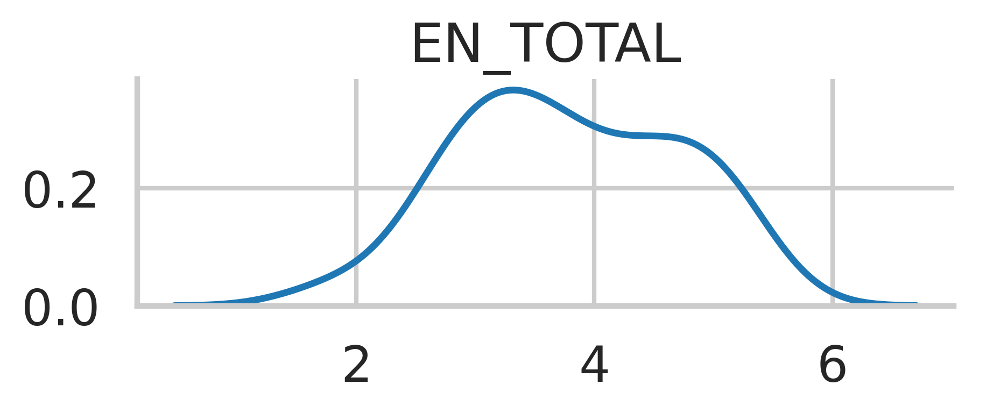

In [ ]:
def make_pair(data, col, col_wrap=1):
  sns.set_theme(style="whitegrid")
  sns.set_context("talk")
  sns.set_palette(sns.color_palette(colors))
  data = df['QS'][col].mean(axis=1).to_frame().rename(columns={0: col + '_TOTAL'})
  data = pd.melt(data)
  data.rename(columns={data.columns[0]: "variable", data.columns[1]: "valor"}, inplace=True)
  g = sns.FacetGrid(data, col=data.columns[0], col_wrap=col_wrap, sharex=False, sharey=False,  aspect=1.8, height=2.6)
  g.map(sns.kdeplot, "valor")
  g.add_legend()
  g.set_xlabels("")
  g.fig.set_dpi(200)
  g.set_titles("{col_name}")

#pd.concat([df['QS']['EN'].mean(axis=1),df['SOCIO']['SOCIO']['SOCIO']['Centre']], axis=1).rename(columns={0: 'EN'})
#make_pair(df, 'LT')
make_pair(df, 'EN')
#make_pair(df, 'POP')
#make_pair(df, 'CO')
#make_pair(df, 'AC')


3.46

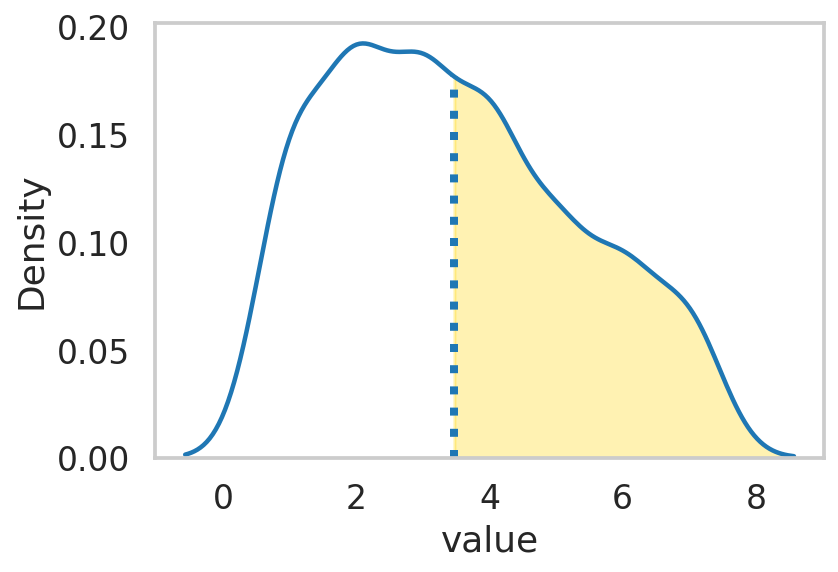

In [ ]:
import scipy

def make_pair(col, cat, col_wrap=1):
  sns.set_theme(style="whitegrid")
  sns.set_context("talk")
  sns.set_palette(sns.color_palette(colors))
  #display(pd.concat([df['QS'][col].mean(axis=1),df['SOCIO']['SOCIO']['SOCIO'][cat]], axis=1).groupby('Centre').mean())
  

  data = pd.concat([df['QS'][col].mean(axis=1),df['SOCIO']['SOCIO']['SOCIO'][cat]], axis=1).rename(columns={0: col})
  data.rename(columns={data.columns[0]: "variable", data.columns[1]: "valor"}, inplace=True)

  display(data.groupby('valor').mean())

  ax = sns.kdeplot(data=data, x=data.columns[0], hue=data.columns[1],legend=False, common_norm=False, common_grid=True)
  
  ax.grid(False)
#  ax.right_ax.grid(False)


  mm = {0: 3, 1: 1, 2:0, 3:2}  # Centre
#  mm = {0:4, 1:3, 2:2, 3:1, 4:0}  # Categoria
  
  for i,kdeline in enumerate(ax.lines):
    x,y = kdeline.get_data()
    mean = data.groupby('valor').mean().iloc[mm[i]]
    height = np.interp(mean, x, y)
    ax.vlines(mean, 0, height, color=kdeline.get_color() , ls=':',lw=4)

def make_pair2(factor, col_wrap=3, aspect=1.8, height=2.6):
  sns.set_theme(style="whitegrid")
  sns.set_context("talk")
  sns.set_palette(sns.color_palette(colors))
  data = df['QS'][factor].groupby(level=0, axis=1).mean()[factors[factor]]
  data = pd.melt(data)
  # data.rename(columns={data.columns[0]: "variable", data.columns[1]: "valor"}, inplace=True)
  #display(data)

  ax = sns.kdeplot(data=data, x=data.columns[1], hue=data.columns[0],legend=False, common_grid=True)

  ax.grid(False)

  mm = {0: 1, 1: 0}
  for i,kdeline in enumerate(ax.lines):
    #display(kdeline.get_color())
    x,y = kdeline.get_data()
    mean = data.groupby('variable').mean().iloc[mm[i]]
   # display(kdeline.get_label())
    height = np.interp(mean, x, y)
    ax.vlines(mean, 0, height, color=kdeline.get_color() , ls=':', lw=4)

def make_pair3(factor, col_wrap=3, aspect=1.8, height=2.6):
  sns.set_theme(style="whitegrid")
  sns.set_context("talk")
  sns.set_palette(sns.color_palette(colors))
  # data = df['QS'][factor].groupby(level=0, axis=1).mean()[factors[factor]]
  # data = pd.melt(data)

  #display(data)

  data2 = dfm[dfm['QS']=='POP'][['QS','value']]
  # data.rename(columns={data.columns[0]: "variable", data.columns[1]: "valor"}, inplace=True)
  #display(data2)
  data2['value'] = data2['value'].astype(int)

  ax = sns.kdeplot(data=data2, x='value',legend=False, common_grid=True)

  ax.grid(False)

  mm = {0: 0, 1: 1}
  for i,kdeline in enumerate(ax.lines):
    #display(kdeline.get_color())
    x,y = kdeline.get_data()
    mean = 3.46 #data2.groupby('QS').mean().iloc[mm[i]]
    display(mean)
   # display(kdeline.get_label())
    height = np.interp(mean, x, y)
    ax.vlines(mean, 0, height, color=kdeline.get_color() , ls=':', lw=4)
    # ax.fill_between(x, 0, y, where=x < mean, color='silver', alpha=0.3)
    ax.fill_between(x, 0, y, where=x > mean, color='gold', alpha=0.3)


#make_pair('LT','Categoria')
#make_pair('EN','Centre')
#make_pair2('CO')
make_pair3('POP')

,Centre,variable,valor
0,Residència,EN_VI,4.833333
1,Residència,EN_VI,4.500000
2,Centre d'Educació Especial,EN_VI,6.333333
3,Llar - Residència,EN_VI,5.166667
4,Centre d'Educació Especial,EN_VI,5.500000
5,Centre d'Educació Especial,EN_VI,5.833333
6,Centre d'Educació Especial,EN_VI,5.833333
7,Residència,EN_VI,3.833333
8,Taller Ocupacional,EN_VI,4.500000
9,Centre d'Educació Especial,EN_VI,5.333333


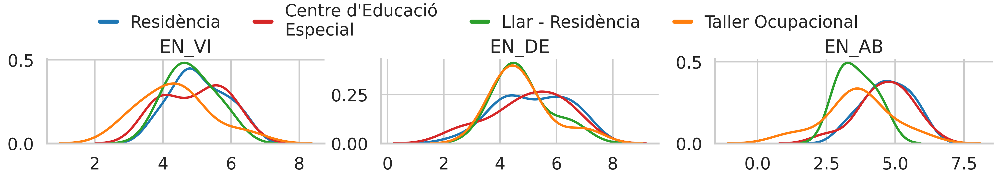

In [ ]:
from textwrap import fill

def make_pair(qs, cat,  bboxy, ncol, bboxx, col_wrap=3, height=2.7, aspect=1.8):
  #data = data.loc[data['QS'] == qs][[cat,"Factor","value","S"]].groupby(["S",cat,"Factor"]).agg(['mean']).reset_index()[[cat,"Factor","value"]] #.pivot_table(index=["S",a], columns=[b]) #.reset_index(level=[0,1]) #.rename_axis(None, axis=1)

  data = pd.concat([df.loc[:, idx[:, [qs]]].groupby(level=2, axis=1).mean(), df.loc[:, idx[:, :, :, [cat]]]], axis=1).rename(columns={("SOCIO","SOCIO","SOCIO",cat):cat})[factors[qs] + [cat]]

  sns.set_theme(style="whitegrid")
  sns.set_context("talk")
  sns.set_palette(sns.color_palette(colors))

  data = pd.melt(data, data.columns[-1], data.columns[:-1])
  data.rename(columns={data.columns[1]: "variable", "value":"valor"}, inplace=True)
  display(data)

  g = sns.FacetGrid(data, col=data.columns[1], hue=data.columns[0], col_wrap=col_wrap, sharex=False, sharey=False, aspect=aspect, height=height)
  g.map(sns.kdeplot, "valor")
  #g.add_legend(loc="lower left", ncol=5, title=" ", fontsize=16, bbox_to_anchor=(0.025,0.8,1,1)) # prop={'size': 10})
  g.add_legend(loc='upper center',  ncol=ncol, bbox_to_anchor=(bboxx, bboxy), frameon=False,handlelength=1)
  for text in g.legend.get_texts():
    text.set_text(fill(text.get_text(), 20))
  for legobj in g.legend.get_lines():
    legobj.set_linewidth(4)

  g.set_xlabels("")
  g.fig.set_dpi(150)
  g.set_titles("{col_name}")

make_pair("EN", 'Centre', bboxy=1.1, ncol=4, bboxx=0.25)

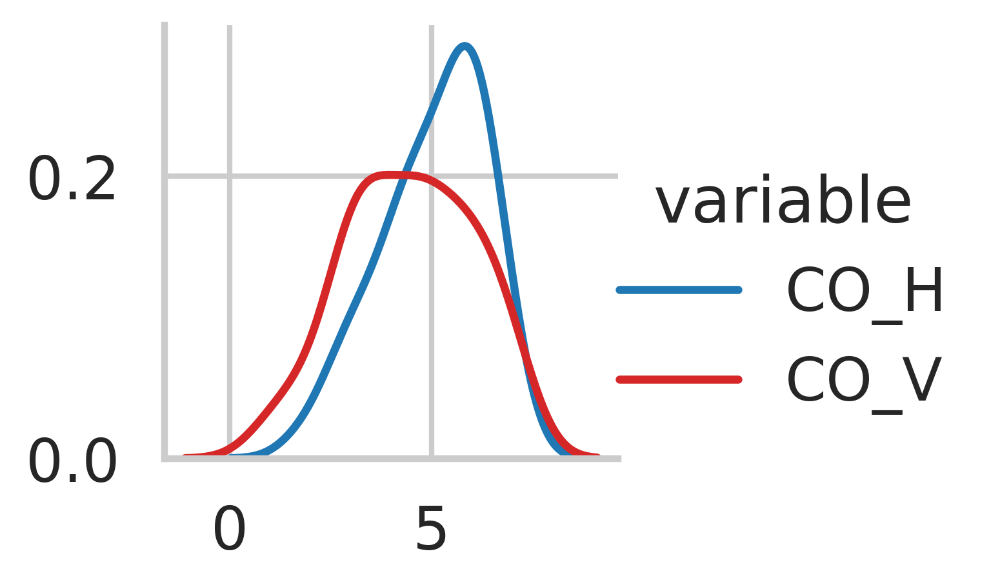

In [ ]:
def make_pair(factor, col_wrap=3, aspect=1.8, height=2.6):
  sns.set_theme(style="whitegrid")
  sns.set_context("talk")
  sns.set_palette(sns.color_palette(colors))
  data = df['QS'][factor].groupby(level=0, axis=1).mean()[factors[factor]]
  data = pd.melt(data)
  data.rename(columns={data.columns[0]: "variable", data.columns[1]: "valor"}, inplace=True)
  g = sns.FacetGrid(data, hue=data.columns[0])
  g.map(sns.kdeplot, "valor")
  g.add_legend()
  g.set_xlabels("")
  g.fig.set_dpi(200)
  g.set_titles("{col_name}")

#make_pair('LT')
make_pair('CO')

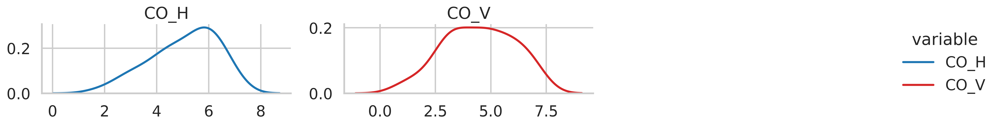

In [ ]:
def make_pair(factor, col_wrap=3, aspect=1.8, height=2.6):
  sns.set_theme(style="whitegrid")
  sns.set_context("talk")
  sns.set_palette(sns.color_palette(colors))
  data = df['QS'][factor].groupby(level=0, axis=1).mean()[factors[factor]]
  data = pd.melt(data)
  data.rename(columns={data.columns[0]: "variable", data.columns[1]: "valor"}, inplace=True)
  g = sns.FacetGrid(data, col=data.columns[0], col_wrap=col_wrap, sharex=False, sharey=False, aspect=aspect, height=height)
  g.map(sns.kdeplot, "valor")
  g.add_legend()
  g.set_xlabels("")
  g.fig.set_dpi(200)
  g.set_titles("{col_name}")

#make_pair('LT')
make_pair('CO')
# make_pair(df['QS']['POP'])
# make_pair(df['QS']['CO'])
# make_pair(df['QS']['AC'])

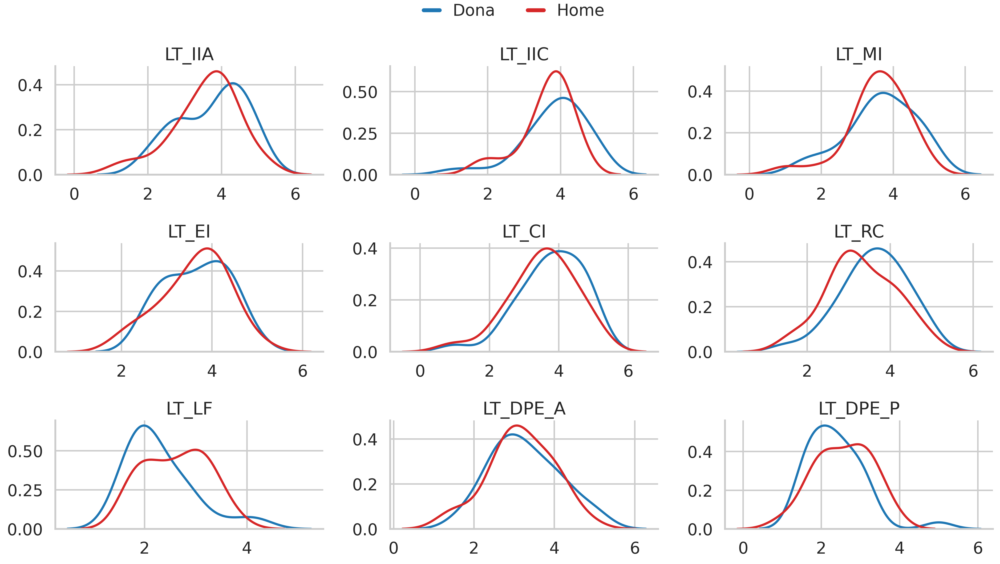

In [ ]:
from textwrap import fill

def make_pair(qs, cat,  bboxy, ncol, bboxx, col_wrap=3, height=2.7, aspect=1.8):
  #data = data.loc[data['QS'] == qs][[cat,"Factor","value","S"]].groupby(["S",cat,"Factor"]).agg(['mean']).reset_index()[[cat,"Factor","value"]] #.pivot_table(index=["S",a], columns=[b]) #.reset_index(level=[0,1]) #.rename_axis(None, axis=1)

  data = pd.concat([df.loc[:, idx[:, [qs]]].groupby(level=2, axis=1).mean(), df.loc[:, idx[:, :, :, [cat]]]], axis=1).rename(columns={("SOCIO","SOCIO","SOCIO",cat):cat})[factors[qs] + [cat]]

  sns.set_theme(style="whitegrid")
  sns.set_context("talk")
  sns.set_palette(sns.color_palette(colors))

  data = pd.melt(data, data.columns[-1], data.columns[:-1])
  data.rename(columns={data.columns[1]: "variable", "value":"valor"}, inplace=True)
  #display(datamelt)

  g = sns.FacetGrid(data, col=data.columns[1], hue=data.columns[0], col_wrap=col_wrap, sharex=False, sharey=False, aspect=aspect, height=height)
  g.map(sns.kdeplot, "valor")
  #g.add_legend(loc="lower left", ncol=5, title=" ", fontsize=16, bbox_to_anchor=(0.025,0.8,1,1)) # prop={'size': 10})
  g.add_legend(loc='upper center',  ncol=ncol, bbox_to_anchor=(bboxx, bboxy), frameon=False,handlelength=1)
  for text in g.legend.get_texts():
    text.set_text(fill(text.get_text(), 20))
  for legobj in g.legend.get_lines():
    legobj.set_linewidth(4)

  g.set_xlabels("")
  g.fig.set_dpi(150)
  g.set_titles("{col_name}")

make_pair("LT" , 'Gènere', bboxy=1.05, ncol=2, bboxx=0.42)
# make_pair("LT", 'Categoria', bboxy=1.1, ncol=5, bboxx=0.22)
# make_pair("LT", 'Contracte', bboxy=1.05, ncol=2, bboxx=0.4)
# make_pair("LT", 'Centre', bboxy=1.1, ncol=4, bboxx=0.25)

# make_pair("EN", 'Gènere', bboxy=1.15, ncol=2, bboxx=0.42, height=3, aspect=1.6)
# make_pair("EN", 'Categoria', bboxy=1.25, ncol=5, bboxx=0.22, height=3, aspect=1.6)
# make_pair("EN", 'Contracte', bboxy=1.15, ncol=2, bboxx=0.4, height=3, aspect=1.6)
# make_pair("EN", 'Centre', bboxy=1.25, ncol=4, bboxx=0.25, height=3, aspect=1.6)

# make_pair("POP",'Gènere', bboxy=1.05, ncol=2, bboxx=0.42)
# make_pair("POP",'Categoria', bboxy=1.1, ncol=5, bboxx=0.22)
# make_pair("POP",'Contracte', bboxy=1.05, ncol=2, bboxx=0.4)
# make_pair("POP",'Centre', bboxy=1.1, ncol=4, bboxx=0.25)

# make_pair("CO", 'Gènere', ncol=2, bboxx=0.28, bboxy=1.15, height=3.2, aspect=1.5)
# make_pair("CO", 'Categoria', ncol=5, bboxx=0.22, bboxy=1.2, height=3.2, aspect=1.5)
# make_pair("CO", 'Contracte', ncol=2, bboxx=0.28, bboxy=1.15, height=3.2, aspect=1.5)
# make_pair("CO", 'Centre', ncol=4, bboxx=0.25, bboxy=1.2, height=3.2, aspect=1.5)

# make_pair("AC", 'Gènere', bboxy=1.15, ncol=2, bboxx=0.42, height=3, aspect=1.6)
# make_pair("AC", 'Categoria', bboxy=1.25, ncol=5, bboxx=0.22, height=3, aspect=1.6)
# make_pair("AC", 'Contracte', bboxy=1.15, ncol=2, bboxx=0.4, height=3, aspect=1.6)
# make_pair("AC", 'Centre', bboxy=1.25, ncol=4, bboxx=0.25, height=3, aspect=1.6)

In [ ]:
def make_bar(data):
  sns.set_theme(style="whitegrid")
  sns.set_context("talk")
  sns.set_palette(sns.color_palette(colors))
  #data = df['QS']['LT'].copy() #.reset_index(level=0, axis=1)
  #df2.index = df2.index.to_flat_index()
  data.columns = [a[1] for a in data.columns.to_flat_index()]

  #cat_plot = sns.catplot(data=df[qLT], kind='point', ci="sd", join=False, capsize=0.1, aspect=3, grid='both')
  result = data.aggregate(['mean']).transpose().reset_index().sort_values('mean',ascending=False)['index'].array
  # result
  cat_plot = sns.catplot(data=data, kind='bar', ci="sd", alpha=.6, aspect=4, order=result)
  #cat_plot.ax.xaxis.grid(True)
  cat_plot.ax.set_xticklabels(cat_plot.ax.get_xticklabels(), rotation = 90,)
  cat_plot.ax.set_xlabel("")

make_bar(df['QS']['LT'])
make_bar(df['QS']['EN'])
make_bar(df['QS']['POP'])
make_bar(df['QS']['CO']])
make_bar(df['QS']['AC'])

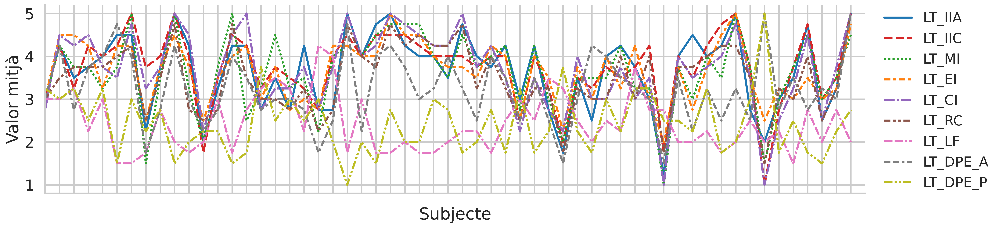

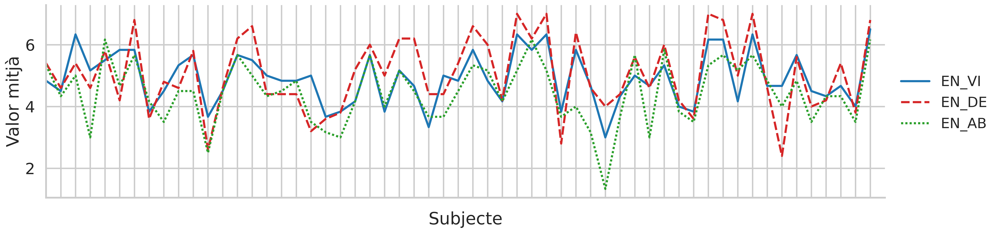

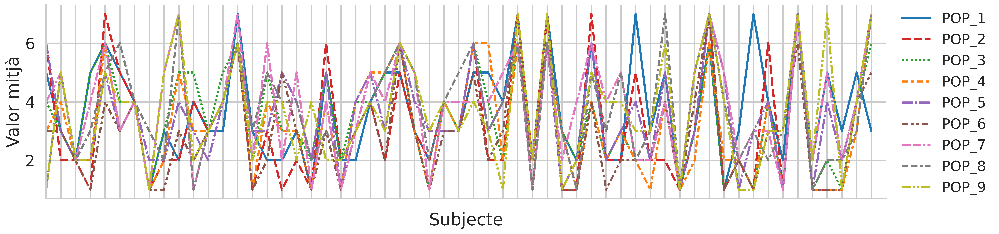

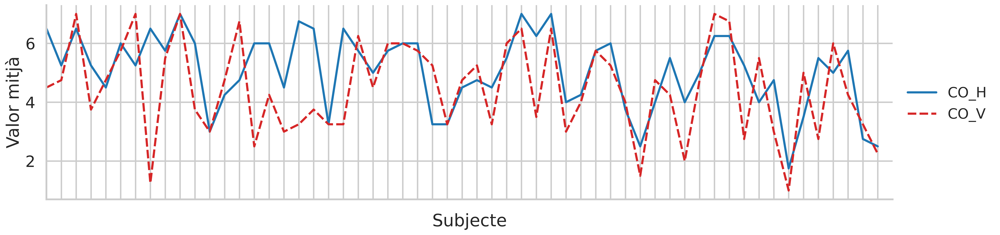

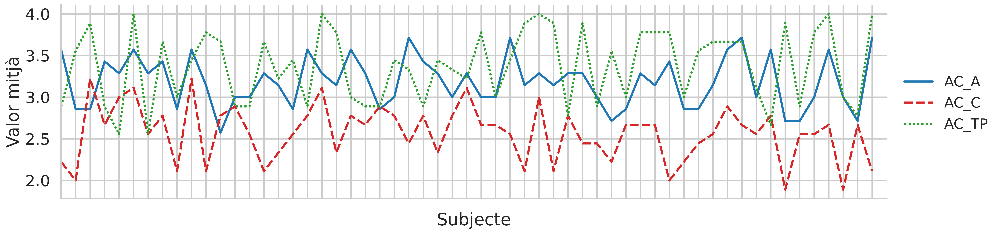

In [ ]:
def make_line(factor):
  sns.set_theme(style="whitegrid")
  sns.set_context("poster")
  sns.set_palette(sns.color_palette(colors))
  data = df['QS'][factor].groupby(level=0, axis=1).aggregate('mean')[factors[factor]]

  rel_plot = sns.relplot(data=data, kind="line", aspect=3.5)
  rel_plot.fig.set_dpi(200)
  rel_plot.set(xlim=(1,58), xticks=range(1,58), xticklabels=["" for i in range(1,58)], xlabel="Subjecte", ylabel="Valor mitjà")
  
  handles, labels = rel_plot.ax.get_legend_handles_labels()
  rel_plot._legend.remove()
  rel_plot.fig.legend(handles, labels, ncol=1, loc='center right',  bbox_to_anchor=(1, 0.51), frameon=False, fontsize=20,)
  rel_plot.ax.set_xlabel("Subjecte")


make_line('LT') 
make_line('EN')
make_line('POP')
make_line('CO')
make_line('AC')

#make_line(df['QS']['LT'].groupby("LT").aggregate('mean'))


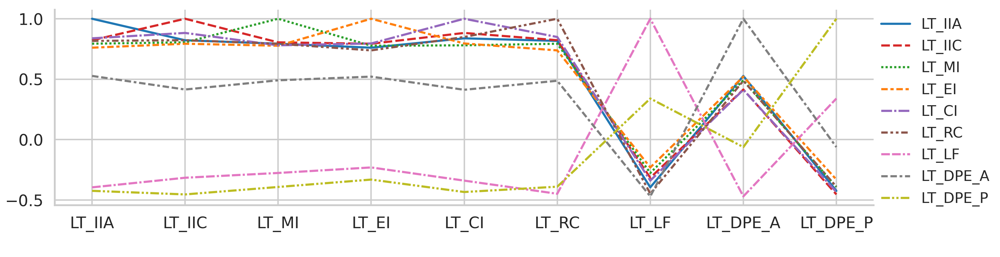

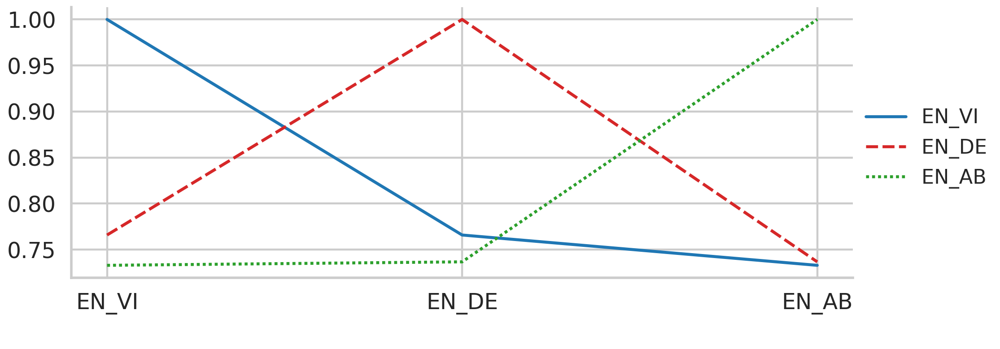

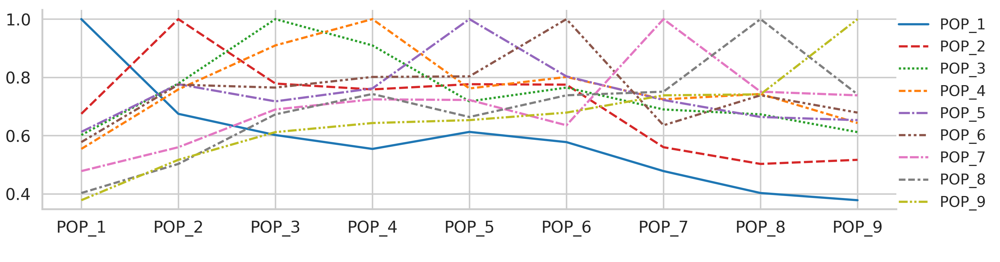

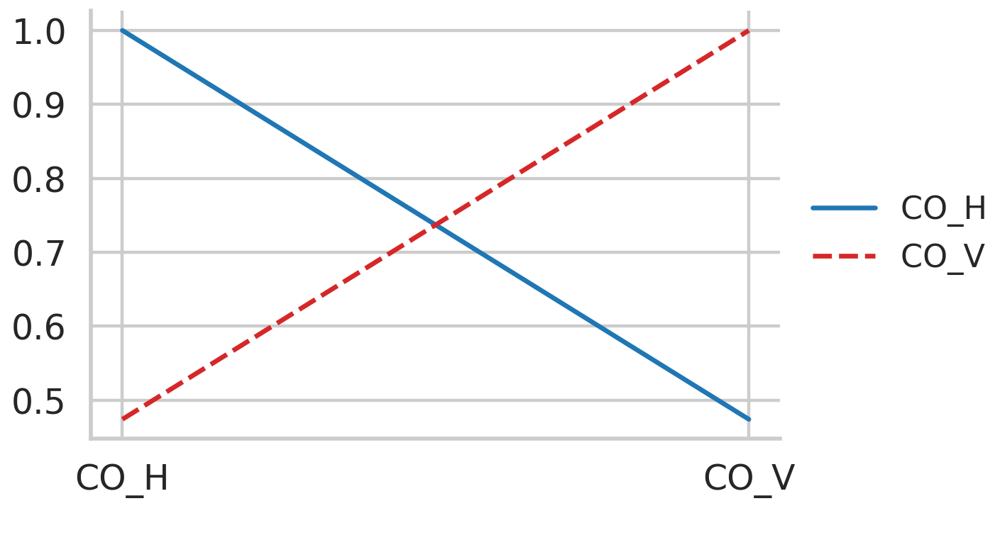

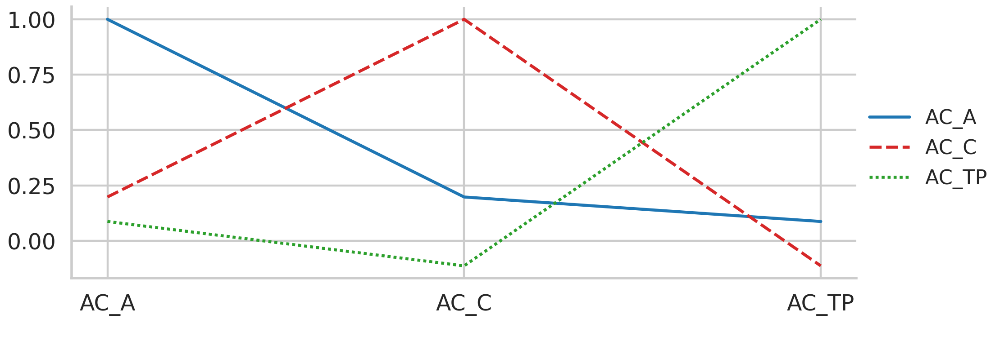

In [ ]:
def make_corr(factor, aspect, bboxy=1.15):
  sns.set_theme(style="whitegrid")
  sns.set_context("poster")
  sns.set_palette(sns.color_palette(colors))

  data = df['QS'][factor].groupby(level=0, axis=1).aggregate('mean')[factors[factor]].corr()
  rel_plot = sns.relplot(data=data, kind="line", aspect=aspect)
  rel_plot.fig.set_dpi(80)
  # rel_plot.fig.tight_layout(pad=0.5, w_pad=3.5, h_pad=0.5)
  rel_plot.ax.set_xlabel(" ")
 
  handles, labels = rel_plot.ax.get_legend_handles_labels()
  for label in range(len(labels)):
    labels[label] = labels[label] + "     "
  rel_plot.fig.legend(handles, labels, ncol=1, loc='center right', borderaxespad=0., bbox_to_anchor=(0.98, 0.56), frameon=False, fontsize=20,)
  rel_plot._legend.remove()

make_corr('LT', 3.5) 
make_corr('EN', 2.5) 
make_corr('POP', 3.5)
make_corr('CO', 1.5)
make_corr('AC', 2.5)


In [ ]:
pd.options.display.float_format = "{:,.2f}".format
a="Contracte"
b="Factor"
data = dfm[[a,b,"value"]].groupby([a,b]).agg(['mean','std']).reset_index().pivot_table(index=a, columns=b).reset_index()
data = data.transpose().reorder_levels([0,2,1]) #.columns = #.iloc[0] #.reset_index(col_level=1)
colus = list(data.iloc[0])
colus
data = data.reset_index()
data = data.iloc[1:]
data.columns = ['level_0', 'Factor', 'level_2'] + colus
data.sort_values(by=["Factor","level_2"]).iloc[:, 3:]
#data
#dfm.head()
#data
#save_to_sheet(data,"FactX"+a)


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:6836: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  observed=observed,
/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,Indefinit,Temporal
1,3.18,3.23
27,0.78,0.76
2,2.57,2.59
28,1.14,1.25
3,3.38,3.36
29,0.66,0.64
4,4.96,5.53
30,1.59,1.20
5,4.20,5.67
31,1.83,1.44


In [ ]:
pd.options.display.float_format = "{:,.2f}".format
dfm[["Q","value"]].groupby(["Q"]).describe()

value                 
               count unique  top freq
Q                                    
AC_1            57    3      4    31 
AC_10           57    2      1    41 
AC_11           57    4      4    23 
AC_12           57    4      3    30 
AC_13           57    3      3    36 
AC_14           57    4      3    24 
AC_15           57    4      3    25 
AC_16           57    4      3    28 
AC_17           57    2      3    31 
AC_18           57    2      3    30 
AC_19           57    3      4    29 
AC_2            57    3      4    40 
AC_20           57    2      4    32 
AC_21           57    4      4    24 
AC_22           57    4      4    21 
AC_23           57    3      3    29 
AC_24           57    2      3    31 
AC_25           57    3      3    33 
AC_3            57    3      4    29 
AC_4            57    3      1    36 
AC_5            57    4      4    28 
AC_6            57    4      1    20 
AC_7            57    4      3    29 
AC_8            57    4      2    20 
AC_9            57    4      4    40 
CO_1            57    5      6    16 
CO_2            57    6      5    17 
CO_3            57    7      5    12 
CO_4            57    7      5    17 
CO_5            57    7      6    11 
CO_6            57    7      5    11 
CO_7            57    7      5    17 
CO_8            57    7      5    16 
EN_1            57    6      3    15 
EN_10           57    5      5    21 
EN_11           57    6      4    20 
EN_12           57    6      4    16 
EN_13           57    6      5    13 
EN_14           57    7      3    18 
EN_15           57    6      5    16 
EN_16           57    7      2    16 
EN_17           57    6      6    18 
EN_2            57    6      5    19 
EN_3            57    7      3    16 
EN_4            57    6      5    18 
EN_5            57    6      3    17 
EN_6            57    7      3    15 
EN_7            57    6      4    13 
EN_8            57    7      2    19 
EN_9            57    7      4    16 
GrupAntiguitat  57    6      0-4  27 
LT_1            57    5      4    27 
LT_10           57    5      4    22 
LT_11           57    5      3    20 
LT_12           57    5      2    20 
LT_13           57    5      4    25 
LT_14           57    5      4    22 
LT_15           57    5      4    15 
LT_16           57    5      3    20 
LT_17           57    5      2    25 
LT_18           57    5      4    22 
LT_19           57    5      5    22 
LT_2            57    5      3    26 
LT_20           57    5      1    27 
LT_21           57    5      4    21 
LT_22           57    5      3    19 
LT_23           57    5      4    24 
LT_24           57    5      4    18 
LT_25           57    5      5    18 
LT_26           57    5      3    18 
LT_27           57    5      3    20 
LT_28           57    5      2    22 
LT_29           57    5      5    19 
LT_3            57    5      3    25 
LT_30           57    5      4    24 
LT_31           57    5      4    23 
LT_32           57    5      3    22 
LT_33           57    5      4    20 
LT_34           57    5      4    26 
LT_35           57    5      4    19 
LT_36           57    5      4    23 
LT_4            57    4      4    23 
LT_5            57    5      1    24 
LT_6            57    5      4    22 
LT_7            57    5      1    20 
LT_8            57    5      4    23 
LT_9            57    5      4    21 
POP_1           57    7      2    14 
POP_2           57    7      1    16 
POP_3           57    7      1    12 
POP_4           57    7      0    13 
POP_5           57    7      2    13 
POP_6           57    7      0    17 
POP_7           57    7      3    14 
POP_8           57    7      2    13 
POP_9           57    7      3    13

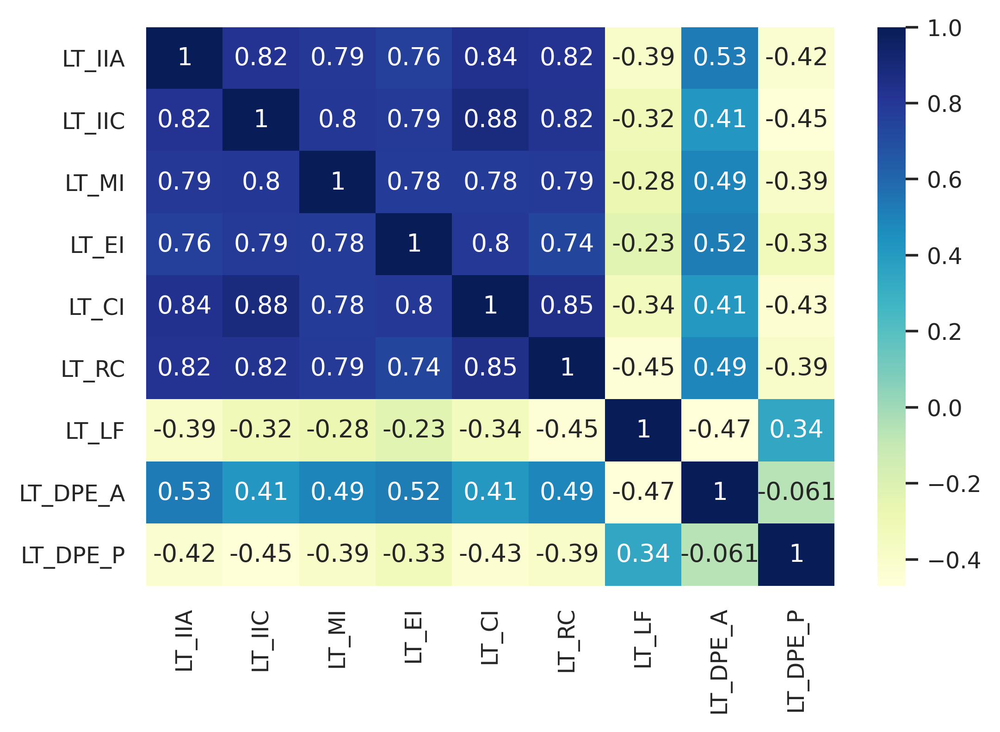

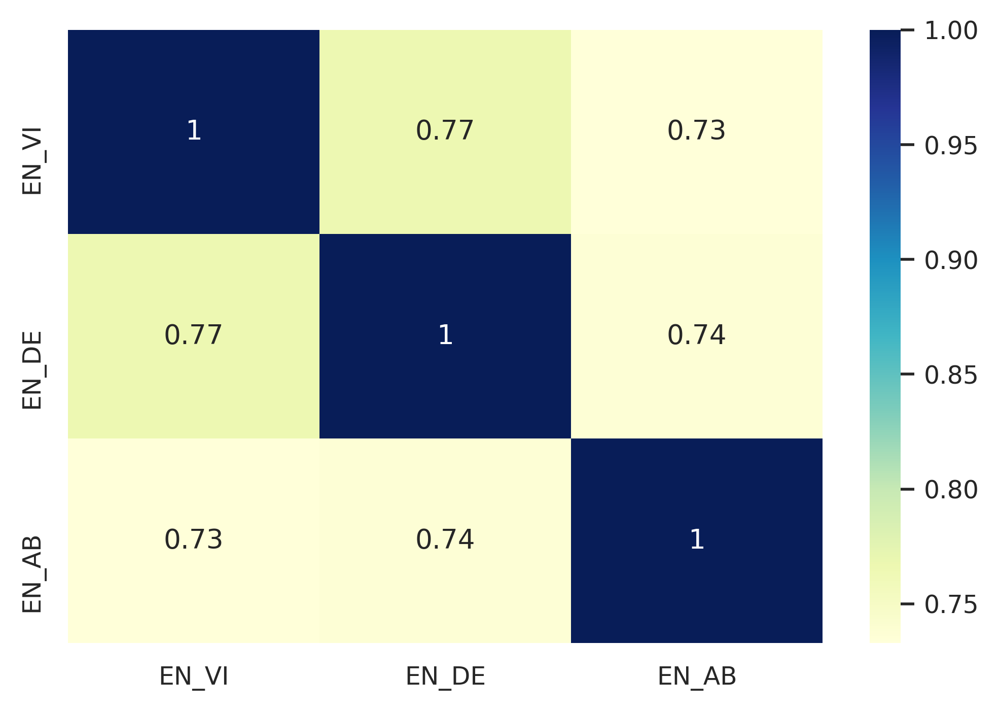

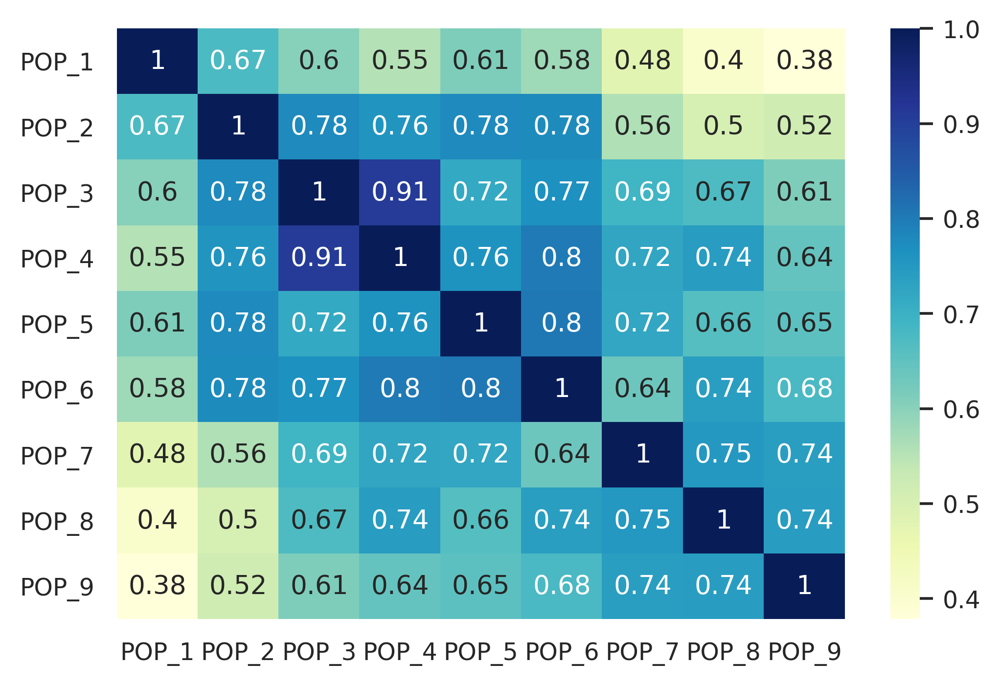

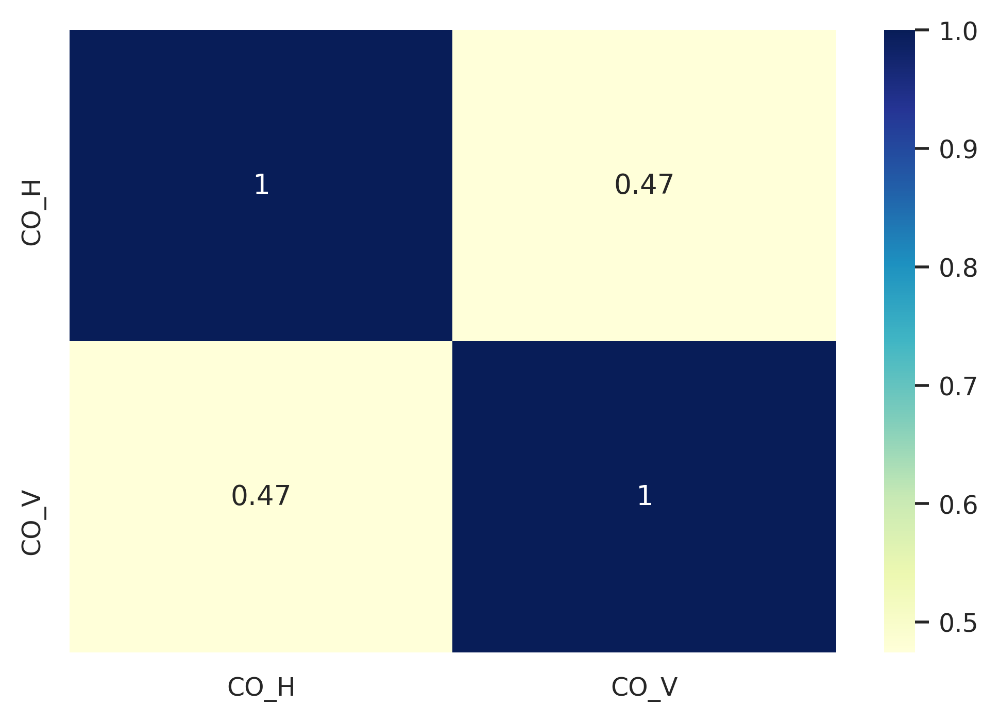

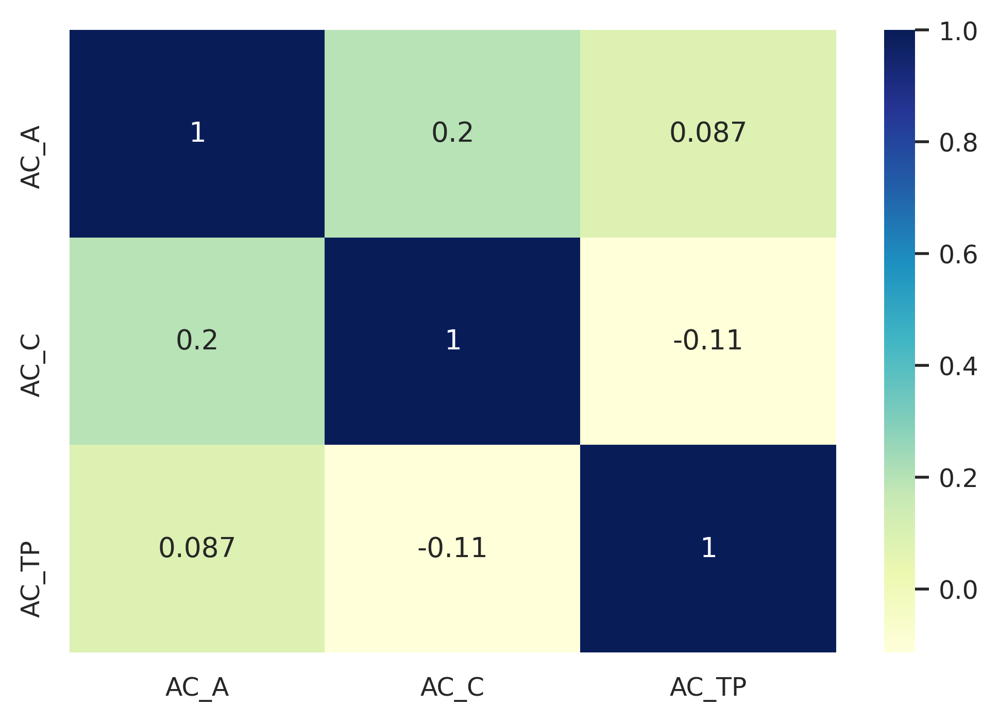

In [ ]:


#df.loc[:, idx[:, ['POP']]].groupby(level=2, axis=1).mean().corr().style.background_gradient(cmap ='Reds').set_properties(**{'font-size': '20px'}) #.corrwith(df.loc[:, idx[:, ['CO']]])
def make_heatmap(factor):
  sns.set_theme(style="whitegrid")
  sns.set_context("paper")
  sns.set_palette(sns.color_palette(colors))
  fig, ax = plt.subplots()
  fig.set_dpi(200)
  heatmap = sns.heatmap(df.loc[:, idx[:, [factor]]].groupby(level=2, axis=1).mean()[factors[factor]].corr(), annot=True, cmap="YlGnBu",cbar_kws={"orientation": "vertical"}, ax=ax)

make_heatmap("LT")
make_heatmap("EN")
make_heatmap("POP")
make_heatmap("CO")
make_heatmap("AC")

#df.loc[:, idx[:, ["LT"]]].groupby(level=2, axis=1).mean()[iLT].corr()

#df["QS"].groupby(level=1, axis=1).mean().corr()

#df['QS']['EN'][slice(None)]['EN_1'] #['EN_1']['EN_2'] #.groupby(level=0, axis=1).mean().corr().head()

In [ ]:
dfm[dfm['QS']=='POP']['value'].mean()

3.4639376218323585